In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('atp_matches_till_2022.csv')

In [3]:
df.shape

(188161, 49)

In [4]:
"""
Data description

• tourney_id - tournament_id

• tourney_name - tournament_name

• surface - surface in which the match is played

• draw_size - the size of the draw

• tourney_level - tournament level

'G' = Grand Slams

'M' = Masters 1000s

'A' = other tour-level events

'C' = Challengers

'S' = Satellites/ITFs

'F' = Tour finals and other season-ending events

'D' = Davis Cup

• tourney_date - starting date of the tournament

• match num - match number in a certain tournament

• id - player id

• seed - the seed of the player in that tournament

• entry - How did the player enter the tournaments?

WC - Wildcard

Q - Qualifier

LL - Lucky loser

PR - Protected ranking

SE - Special Exempt

ALT - Alternate player

• name - player name

• hand - hand of the player, right or left

• ht - the height of the player

• IOC - the country of origin

• age - age of the player

• score - final score in the match

• best_of - the maximum number of sets played

• round - the round in the tournament a match belongs to

• minutes - duration of the match in minutes

• ace - number of aces in the match
• df - double faults

• svpt - serve percent

• 1stin - first serve in percent

• 1stWon - first serve winning percent

• 2ndWon - second serve winning percent

• SvGms - number of games played on serve (So, the maximum difference between w_SvGms and l_SvGms will be 1)

• bpSaved - breakpoints saved

• bpFaced - breakpoints faced
"""

"\nData description\n\n• tourney_id - tournament_id\n\n• tourney_name - tournament_name\n\n• surface - surface in which the match is played\n\n• draw_size - the size of the draw\n\n• tourney_level - tournament level\n\n'G' = Grand Slams\n\n'M' = Masters 1000s\n\n'A' = other tour-level events\n\n'C' = Challengers\n\n'S' = Satellites/ITFs\n\n'F' = Tour finals and other season-ending events\n\n'D' = Davis Cup\n\n• tourney_date - starting date of the tournament\n\n• match num - match number in a certain tournament\n\n• id - player id\n\n• seed - the seed of the player in that tournament\n\n• entry - How did the player enter the tournaments?\n\nWC - Wildcard\n\nQ - Qualifier\n\nLL - Lucky loser\n\nPR - Protected ranking\n\nSE - Special Exempt\n\nALT - Alternate player\n\n• name - player name\n\n• hand - hand of the player, right or left\n\n• ht - the height of the player\n\n• IOC - the country of origin\n\n• age - age of the player\n\n• score - final score in the match\n\n• best_of - the ma

In [5]:
df.dtypes

tourney_id             object
tourney_name           object
surface                object
draw_size               int64
tourney_level          object
tourney_date            int64
match_num               int64
winner_id               int64
winner_seed           float64
winner_entry           object
winner_name            object
winner_hand            object
winner_ht             float64
winner_ioc             object
winner_age            float64
loser_id                int64
loser_seed            float64
loser_entry            object
loser_name             object
loser_hand             object
loser_ht              float64
loser_ioc              object
loser_age             float64
score                  object
best_of                 int64
round                  object
minutes               float64
w_ace                 float64
w_df                  float64
w_svpt                float64
w_1stIn               float64
w_1stWon              float64
w_2ndWon              float64
w_SvGms   

In [6]:
pd.set_option('display.max_columns', None)

In [7]:
pd.set_option('display.max_rows', None)

In [8]:
df.head(1000)

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
0,1968-2029,Dublin,Grass,32,A,19680708,270,112411,NaN,NaN,Douglas Smith,U,NaN,AUS,NaN,110196,NaN,NaN,Peter Ledbetter,U,NaN,UNK,24.0,6-1 7-5,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1968-2029,Dublin,Grass,32,A,19680708,271,126914,NaN,NaN,Louis Pretorius,R,NaN,RSA,NaN,209536,NaN,NaN,Maurice Pollock,U,NaN,IRL,NaN,6-1 6-1,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1968-2029,Dublin,Grass,32,A,19680708,272,209523,NaN,NaN,Cecil Pedlow,U,NaN,IRL,NaN,209535,NaN,NaN,John Mulvey,U,NaN,IRL,NaN,6-2 6-2,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1968-2029,Dublin,Grass,32,A,19680708,273,100084,NaN,NaN,Tom Okker,R,178.0,NED,24.3,209534,NaN,NaN,Unknown Fearmon,U,NaN,NaN,NaN,6-1 6-1,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1968-2029,Dublin,Grass,32,A,19680708,274,100132,NaN,NaN,Armistead Neely,R,NaN,USA,21.3,209533,NaN,NaN,Harry Sheridan,U,NaN,IRL,NaN,6-2 6-4,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,1968-2029,Dublin,Grass,32,A,19680708,275,207073,NaN,NaN,John Mcgrath,NaN,NaN,IRL,NaN,209532,NaN,NaN,B Kelly,U,NaN,NaN,NaN,4-6 8-6 6-2,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1968-2029,Dublin,Grass,32,A,19680708,276,109783,NaN,NaN,Bob Howe,R,183.0,AUS,42.9,125672,NaN,NaN,Kenneth Reid,U,NaN,IRL,NaN,6-0 9-7,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1968-2029,Dublin,Grass,32,A,19680708,277,109745,NaN,NaN,Lew Hoad,R,179.0,AUS,33.6,125716,NaN,NaN,Jim Buckley,U,NaN,IRL,31.2,6-1 6-1,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1968-2029,Dublin,Grass,32,A,19680708,278,201749,NaN,NaN,Graydon Garner,R,NaN,RSA,NaN,113401,NaN,NaN,Vivian Gotto,U,NaN,IRL,46.8,6-1 6-0,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1968-2029,Dublin,Grass,32,A,19680708,279,209525,NaN,NaN,Dennis Foley,U,NaN,IRL,NaN,110045,NaN,NaN,Peter Mockler,R,NaN,IRL,NaN,4-6 6-4 6-0,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
"""
Por simplificación y, para mayor relevancia con los actuales jugadores, 
me quedo con los partidos de tenis jugados desde el 2004 en adelante.
"""
df_truncated = df[df['tourney_date']>= 20040101]

In [10]:
df_truncated.shape

(55728, 49)

In [11]:
df_truncated.head(1000)

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
132433,2004-1536,Madrid Masters,Hard,48,M,20041018,1,102610,NaN,NaN,Albert Costa,R,180.0,ESP,29.3,103789,NaN,NaN,Irakli Labadze,L,188.0,GEO,23.3,6-2 5-7 7-5,3,R64,161.0,8.0,1.0,99.0,58.0,45.0,21.0,16.0,8.0,10.0,5.0,13.0,118.0,64.0,40.0,28.0,16.0,13.0,17.0,54.0,705.0,65.0,598.0
132434,2004-1536,Madrid Masters,Hard,48,M,20041018,2,103344,NaN,NaN,Ivan Ljubicic,R,193.0,CRO,25.5,104607,NaN,Q,Tomas Berdych,R,196.0,CZE,19.0,6-4 6-4,3,R64,76.0,10.0,3.0,55.0,29.0,26.0,15.0,10.0,1.0,1.0,6.0,4.0,58.0,29.0,21.0,16.0,10.0,4.0,6.0,29.0,1085.0,38.0,883.0
132435,2004-1536,Madrid Masters,Hard,48,M,20041018,3,102179,NaN,Q,Antony Dupuis,R,185.0,FRA,31.6,102860,NaN,NaN,Agustin Calleri,R,183.0,ARG,28.0,6-4 6-4,3,R64,72.0,9.0,0.0,49.0,32.0,27.0,14.0,10.0,0.0,0.0,5.0,5.0,65.0,28.0,23.0,19.0,10.0,2.0,4.0,96.0,436.0,56.0,685.0
132436,2004-1536,Madrid Masters,Hard,48,M,20041018,4,103084,NaN,NaN,Guillermo Canas,R,185.0,ARG,26.8,104019,NaN,Q,Kristof Vliegen,R,193.0,BEL,22.3,5-7 7-5 6-1,3,R64,147.0,6.0,7.0,88.0,44.0,32.0,24.0,16.0,2.0,6.0,9.0,3.0,107.0,53.0,35.0,23.0,15.0,4.0,10.0,16.0,1369.0,112.0,384.0
132437,2004-1536,Madrid Masters,Hard,48,M,20041018,5,104417,NaN,NaN,Robin Soderling,R,193.0,SWE,20.1,104252,NaN,NaN,Florian Mayer,R,190.0,GER,21.0,6-3 7-6(2),3,R64,79.0,8.0,1.0,96.0,57.0,45.0,19.0,11.0,5.0,5.0,4.0,1.0,57.0,37.0,27.0,13.0,10.0,2.0,3.0,34.0,965.0,35.0,961.0
132438,2004-1536,Madrid Masters,Hard,48,M,20041018,6,102374,NaN,WC,Alex Corretja,R,180.0,ESP,30.5,103970,NaN,WC,David Ferrer,R,175.0,ESP,22.5,7-5 6-1,3,R64,72.0,5.0,2.0,51.0,25.0,25.0,16.0,10.0,1.0,1.0,4.0,6.0,62.0,34.0,26.0,8.0,9.0,2.0,5.0,86.0,471.0,42.0,824.0
132439,2004-1536,Madrid Masters,Hard,48,M,20041018,7,103163,NaN,NaN,Tommy Haas,R,188.0,GER,26.5,103598,NaN,NaN,Xavier Malisse,R,185.0,BEL,24.2,6-4 6-1,3,R64,58.0,4.0,3.0,49.0,30.0,26.0,12.0,9.0,4.0,4.0,5.0,2.0,43.0,25.0,18.0,7.0,8.0,1.0,4.0,26.0,1135.0,49.0,760.0
132440,2004-1536,Madrid Masters,Hard,48,M,20041018,8,103758,NaN,NaN,Taylor Dent,R,188.0,USA,23.4,104022,NaN,NaN,Mikhail Youzhny,R,183.0,RUS,22.3,6-3 6-2,3,R64,55.0,5.0,0.0,44.0,32.0,28.0,8.0,9.0,0.0,0.0,3.0,7.0,54.0,30.0,18.0,10.0,8.0,3.0,6.0,40.0,855.0,31.0,1065.0
132441,2004-1536,Madrid Masters,Hard,48,M,20041018,9,103632,NaN,NaN,Luis Horna,R,180.0,PER,24.0,102271,NaN,NaN,Hicham Arazi,L,175.0,MAR,30.9,6-4 7-5,3,R64,96.0,6.0,2.0,73.0,39.0,29.0,19.0,11.0,3.0,4.0,4.0,1.0,75.0,49.0,30.0,15.0,11.0,7.0,10.0,41.0,845.0,48.0,765.0
132442,2004-1536,Madrid Masters,Hard,48,M,20041018,10,103888,NaN,NaN,Mardy Fish,R,188.0,USA,22.8,104339,NaN,NaN,Mario Ancic,R,196.0,CRO,20.5,0-6 6-4 6-4,3,R64,101.0,4.0,5.0,64.0,28.0,22.0,20.0,13.0,0.0,3.0,9.0,6.0,87.0,48.0,35.0,21.0,13.0,6.0,8.0,30.0,1070.0,28.0,1111.0


In [12]:
df_truncated.to_csv('atp_matches_2004_2022.csv')

In [13]:
df_truncated.info()

<class 'pandas.core.frame.DataFrame'>
Index: 55728 entries, 132433 to 188160
Data columns (total 49 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   tourney_id          55728 non-null  object 
 1   tourney_name        55728 non-null  object 
 2   surface             55728 non-null  object 
 3   draw_size           55728 non-null  int64  
 4   tourney_level       55728 non-null  object 
 5   tourney_date        55728 non-null  int64  
 6   match_num           55728 non-null  int64  
 7   winner_id           55728 non-null  int64  
 8   winner_seed         23616 non-null  float64
 9   winner_entry        7024 non-null   object 
 10  winner_name         55728 non-null  object 
 11  winner_hand         55717 non-null  object 
 12  winner_ht           54632 non-null  float64
 13  winner_ioc          55728 non-null  object 
 14  winner_age          55725 non-null  float64
 15  loser_id            55728 non-null  int64  
 16  los

### Nos quedamos con las filas de las columnas w_ y l_ que no son nulas, ya que nos da data precisa de los
### puntos ganados y perdidos. El resto los reemplazamos con 0 y transformamos las columnas float a int.
### No es necesaria la precisión decimal para este caso.

In [35]:
nombres_columnas = df.columns
nombres_columnas_lista = nombres_columnas.tolist()
#df_truncated_aux = df_truncated.dropna()
#df_truncated_aux
df_truncated_2 = df_truncated[df_truncated['w_ace'].notnull()]
df_truncated_2 = df_truncated_2.fillna(0)
for c in df_truncated_2.columns:
    if df_truncated_2[c].dtype == np.float:
        df_truncated_2[c] = df_truncated_2[c].astype(int)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_18932\1697146378.py:8: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if df_truncated_2[c].dtype == np.float:
C:\Users\Usuario\AppData\Local\Temp\ipykernel_18932\1697146378.py:8: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if df_truncated_2[c].dtype == np.float:
C:\Users\Usuario\AppData\Local

 ### Abstract
 ##### La ciencia de datos juega un papel preponderante y en crecimiento en cuanto al análisis y predicciones de los resultados de los eventos deportivos. Estos se usa principalmente en el fútbol europeo donde casi todos los equipos y selecciones del continente, tienen departamentos de datos dedicados a identificar jugadores, estudiar lesiones y el reclutamiento de nuevos talentos. También, se ve mucha aplicación en el básquet y béisbol en EE.UU. por lo mismos motivos. En el mundo de tenis, los datos están presentes como algo descriptivo del juego y que, hace años, está presente en las transmiciones de TV como en las páginas web del circuito profesional. Actualmente, la data de los partidos se usa mucho para las casas de apuestas para determinar las probabilidades del ganador del partido. No se usa mucho para el desarrollo del club o equipo como se usa en el fútbol, todavía es algo "verde". En nuestro caso, busco hacer una análisis completo de cada perfil de jugador y entender cuáles son los mejores match-ups y que probabilidades tienen de ganar. Lo que se muestra a continuación, es algo experimental y no es definitivo.

In [15]:
df_truncated_2.shape

(50996, 49)

In [16]:
df_truncated_2.head(1000)

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
132433,2004-1536,Madrid Masters,Hard,48,M,20041018,1,102610,0,0,Albert Costa,R,180,ESP,29,103789,0,0,Irakli Labadze,L,188,GEO,23,6-2 5-7 7-5,3,R64,161,8,1,99,58,45,21,16,8,10,5,13,118,64,40,28,16,13,17,54,705,65,598
132434,2004-1536,Madrid Masters,Hard,48,M,20041018,2,103344,0,0,Ivan Ljubicic,R,193,CRO,25,104607,0,Q,Tomas Berdych,R,196,CZE,19,6-4 6-4,3,R64,76,10,3,55,29,26,15,10,1,1,6,4,58,29,21,16,10,4,6,29,1085,38,883
132435,2004-1536,Madrid Masters,Hard,48,M,20041018,3,102179,0,Q,Antony Dupuis,R,185,FRA,31,102860,0,0,Agustin Calleri,R,183,ARG,28,6-4 6-4,3,R64,72,9,0,49,32,27,14,10,0,0,5,5,65,28,23,19,10,2,4,96,436,56,685
132436,2004-1536,Madrid Masters,Hard,48,M,20041018,4,103084,0,0,Guillermo Canas,R,185,ARG,26,104019,0,Q,Kristof Vliegen,R,193,BEL,22,5-7 7-5 6-1,3,R64,147,6,7,88,44,32,24,16,2,6,9,3,107,53,35,23,15,4,10,16,1369,112,384
132437,2004-1536,Madrid Masters,Hard,48,M,20041018,5,104417,0,0,Robin Soderling,R,193,SWE,20,104252,0,0,Florian Mayer,R,190,GER,21,6-3 7-6(2),3,R64,79,8,1,96,57,45,19,11,5,5,4,1,57,37,27,13,10,2,3,34,965,35,961
132438,2004-1536,Madrid Masters,Hard,48,M,20041018,6,102374,0,WC,Alex Corretja,R,180,ESP,30,103970,0,WC,David Ferrer,R,175,ESP,22,7-5 6-1,3,R64,72,5,2,51,25,25,16,10,1,1,4,6,62,34,26,8,9,2,5,86,471,42,824
132439,2004-1536,Madrid Masters,Hard,48,M,20041018,7,103163,0,0,Tommy Haas,R,188,GER,26,103598,0,0,Xavier Malisse,R,185,BEL,24,6-4 6-1,3,R64,58,4,3,49,30,26,12,9,4,4,5,2,43,25,18,7,8,1,4,26,1135,49,760
132440,2004-1536,Madrid Masters,Hard,48,M,20041018,8,103758,0,0,Taylor Dent,R,188,USA,23,104022,0,0,Mikhail Youzhny,R,183,RUS,22,6-3 6-2,3,R64,55,5,0,44,32,28,8,9,0,0,3,7,54,30,18,10,8,3,6,40,855,31,1065
132441,2004-1536,Madrid Masters,Hard,48,M,20041018,9,103632,0,0,Luis Horna,R,180,PER,24,102271,0,0,Hicham Arazi,L,175,MAR,30,6-4 7-5,3,R64,96,6,2,73,39,29,19,11,3,4,4,1,75,49,30,15,11,7,10,41,845,48,765
132442,2004-1536,Madrid Masters,Hard,48,M,20041018,10,103888,0,0,Mardy Fish,R,188,USA,22,104339,0,0,Mario Ancic,R,196,CRO,20,0-6 6-4 6-4,3,R64,101,4,5,64,28,22,20,13,0,3,9,6,87,48,35,21,13,6,8,30,1070,28,1111


#### Guardo la última base de datos generada a partir del último truncamiento.

In [17]:
df_truncated_2.to_csv('atp_matches_2004_2022_w_l.csv')

#### Para este trabajo preeliminar, eligo un tenista conocido por casi todos y además, tiene partidos que data desde el año 2004 justo el año donde corto el dataframe original: Rafael Nadal. De él, me quedo con los partidos ganados para identificar patrones de su juego.

In [18]:
df_nadal_1 = df_truncated_2[df_truncated_2['winner_name'] == 'Rafael Nadal']

In [19]:
df_nadal_1.shape

(1028, 49)

In [20]:
df_nadal_1

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
132447,2004-1536,Madrid Masters,Hard,48,M,20041018,15,104745,0,0,Rafael Nadal,L,185,ESP,18,102106,0,0,Davide Sanguinetti,R,188,ITA,32,6-2 6-1,3,R64,62,2,4,47,27,23,9,8,5,6,1,2,41,21,11,6,7,3,8,50,755,75,521
132522,2004-301,Auckland,Hard,32,A,20040112,12,104745,0,0,Rafael Nadal,L,185,ESP,17,102854,4,0,Sjeng Schalken,R,193,NED,27,7-6(2) 6-4,3,R32,125,1,0,88,65,39,14,11,6,9,1,0,92,71,38,11,11,9,13,48,766,16,1445
132532,2004-301,Auckland,Hard,32,A,20040112,22,104745,0,0,Rafael Nadal,L,185,ESP,17,104339,0,Q,Mario Ancic,R,196,CRO,19,7-6(0) 7-6(6),3,R16,113,2,2,79,54,37,18,12,5,7,8,4,83,51,32,18,12,2,4,48,766,74,475
132537,2004-301,Auckland,Hard,32,A,20040112,27,104745,0,0,Rafael Nadal,L,185,ESP,17,102571,0,0,Gregory Carraz,R,190,FRA,28,2-1 RET,3,QF,15,0,0,9,7,6,2,2,0,0,1,0,5,4,3,1,1,0,0,48,766,65,534
132540,2004-301,Auckland,Hard,32,A,20040112,30,104745,0,0,Rafael Nadal,L,185,ESP,17,102562,2,0,Jiri Novak,R,190,CZE,28,6-1 6-3,3,SF,64,1,0,47,31,24,11,8,1,1,2,3,65,36,20,14,8,6,10,48,766,14,1510
132734,2004-316,Bastad,Clay,32,A,20040705,14,104745,0,0,Rafael Nadal,L,185,ESP,18,103181,0,LL,Jiri Vanek,R,185,CZE,26,4-6 6-4 6-3,3,R32,118,0,2,86,69,42,10,15,6,11,0,4,88,50,31,15,14,3,9,60,685,147,275
132743,2004-316,Bastad,Clay,32,A,20040705,23,104745,0,0,Rafael Nadal,L,185,ESP,18,103490,0,Q,Santiago Ventura,R,183,ESP,24,6-1 6-2,3,R16,59,0,2,40,31,25,7,8,0,0,5,4,58,27,19,9,7,6,10,60,685,142,281
132856,2004-321,Stuttgart,Clay,48,A,20040712,27,104745,14,0,Rafael Nadal,L,185,ESP,18,103506,0,0,Martin Vassallo Arguello,R,183,ARG,24,7-6(4) 6-4,3,R32,128,1,3,85,50,32,15,11,7,12,4,9,85,51,33,10,11,8,14,57,685,132,314
132867,2004-321,Stuttgart,Clay,48,A,20040712,38,104745,14,0,Rafael Nadal,L,185,ESP,18,103428,3,0,Juan Ignacio Chela,R,190,ARG,24,6-2 6-3,3,R16,76,3,1,52,25,20,19,9,0,0,2,4,50,29,20,8,8,1,4,57,685,16,1320
132884,2004-325,Palermo,Clay,32,A,20040927,8,104745,6,0,Rafael Nadal,L,185,ESP,18,104597,0,Q,Nicolas Almagro,R,183,ESP,19,6-1 7-5,3,R32,69,0,1,52,33,25,9,10,0,2,1,1,45,22,11,11,9,2,7,49,745,99,418


In [21]:
df_nadal_2 = df_truncated_2[df_truncated_2['loser_name'] == 'Rafael Nadal']

In [22]:
df_nadal_2.shape

(202, 49)

In [23]:
df_nadal_2

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
132463,2004-1536,Madrid Masters,Hard,48,M,20041018,31,102434,14,0,Vincent Spadea,R,183,USA,30,104745,0,0,Rafael Nadal,L,185,ESP,18,6-4 4-6 6-3,3,R32,151,1,4,88,44,30,24,15,3,7,0,4,102,74,46,11,14,11,16,23,1200,50,755
132541,2004-301,Auckland,Hard,32,A,20040112,31,103103,0,0,Dominik Hrbaty,R,183,SVK,26,104745,0,0,Rafael Nadal,L,185,ESP,17,4-6 6-2 7-5,3,F,135,2,4,106,73,46,18,15,8,11,0,4,106,62,36,22,15,11,16,54,639,48,766
132748,2004-316,Bastad,Clay,32,A,20040705,28,103292,2,0,Gaston Gaudio,R,175,ARG,25,104745,0,0,Rafael Nadal,L,185,ESP,18,6-2 6-3,3,QF,78,2,2,49,27,19,8,8,1,4,0,0,49,35,13,4,9,5,12,11,1700,60,685
132872,2004-321,Stuttgart,Clay,48,A,20040712,43,103970,11,0,David Ferrer,R,175,ESP,22,104745,14,0,Rafael Nadal,L,185,ESP,18,6-3 6-7(3) 7-5,3,QF,146,3,3,112,70,47,19,17,2,6,2,1,104,76,44,15,16,7,13,47,749,57,685
132896,2004-325,Palermo,Clay,32,A,20040927,20,103133,0,0,Olivier Mutis,R,175,FRA,26,104745,6,0,Rafael Nadal,L,185,ESP,18,6-3 6-3,3,R16,86,1,1,63,35,26,17,9,7,7,0,0,61,51,29,5,9,2,5,113,372,49,745
132915,2004-328,Basel,Carpet,32,A,20041025,8,102783,6,0,Rainer Schuettler,R,180,GER,28,104745,0,0,Rafael Nadal,L,185,ESP,18,6-3 6-4,3,R32,98,4,2,64,30,23,19,10,5,7,1,3,66,43,26,9,9,4,8,23,1205,48,775
133198,2004-375,Lyon,Carpet,32,A,20041004,11,103898,0,Q,Julien Benneteau,R,185,FRA,22,104745,0,0,Rafael Nadal,L,185,ESP,18,6-3 6-0,3,R32,65,1,1,38,21,15,14,7,0,0,1,3,55,40,22,3,8,7,12,75,518,50,745
133330,2004-403,Miami Masters,Hard,96,M,20040322,81,103602,21,0,Fernando Gonzalez,R,183,CHI,23,104745,32,0,Rafael Nadal,L,185,ESP,17,7-6(1) 4-6 6-2,3,R16,130,8,5,95,61,48,15,15,5,8,1,3,98,70,44,14,15,7,11,22,1150,34,973
133422,2004-404,Indian Wells Masters,Hard,96,M,20040308,78,102860,22,0,Agustin Calleri,R,183,ARG,27,104745,0,0,Rafael Nadal,L,185,ESP,17,6-4 3-6 7-6(10),3,R32,158,8,3,98,52,39,23,15,2,6,0,0,118,85,50,21,16,12,16,23,1155,36,953
133490,2004-408,Milan,Carpet,32,A,20040209,20,104339,0,0,Mario Ancic,R,196,CRO,19,104745,6,0,Rafael Nadal,L,185,ESP,17,7-5 6-2,3,R16,80,10,1,50,37,30,10,10,0,0,0,3,71,47,29,11,10,5,8,107,370,41,914


#### Hacemos una descripción de los datos brindados de sus trinufos. El énfasis va a ser los campos w_ y l_ ya que indican los números del ganador (w_ > Rafael Nadal) contra los del perdedor (l_ > Rivales).

In [24]:
df_nadal_1.describe()

,draw_size,tourney_date,match_num,winner_id,winner_seed,winner_ht,winner_age,loser_id,loser_seed,loser_ht,loser_age,best_of,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
count,1028.000000,1.028000e+03,1028.000000,1028.0,1028.000000,1028.0,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000,1028.000000
mean,77.140078,2.012219e+07,130.250000,104745.0,2.416342,185.0,25.533074,107262.857977,4.106031,185.946498,26.040856,3.624514,113.770428,3.254864,1.611868,71.447471,48.587549,35.942607,13.521401,11.867704,3.022374,4.325875,5.142023,2.716926,77.364786,47.418288,30.186770,12.784047,11.678988,4.996109,9.407588,4.926070,7296.360895,55.678016,1766.391051
std,39.135246,5.084395e+04,183.705685,0.0,2.931514,0.0,5.077000,14133.044166,7.122481,9.058828,3.878923,0.927279,48.576943,2.760344,1.540791,27.194316,19.654591,13.532017,5.553539,4.058243,2.963012,3.836969,5.137569,2.120661,28.314381,19.322461,14.324999,6.407765,4.032254,3.309716,4.122069,9.980525,3443.659432,67.477043,1975.196049
min,4.000000,2.004011e+07,1.000000,104745.0,0.000000,185.0,17.000000,100644.000000,0.000000,0.000000,17.000000,3.000000,0.000000,0.000000,0.000000,9.000000,5.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,5.000000,4.000000,2.000000,0.000000,1.000000,0.000000,0.000000,1.000000,585.000000,1.000000,23.000000
25%,48.000000,2.008043e+07,36.000000,104745.0,1.000000,185.0,21.000000,103888.000000,0.000000,183.000000,23.000000,3.000000,82.000000,1.000000,0.000000,52.000000,34.000000,26.000000,10.000000,9.000000,1.000000,2.000000,2.000000,1.000000,57.000000,33.000000,20.000000,8.000000,9.000000,3.000000,6.000000,1.000000,4875.000000,15.750000,664.750000
50%,64.000000,2.012012e+07,64.000000,104745.0,2.000000,185.0,25.000000,104593.000000,0.000000,185.000000,26.000000,3.000000,107.500000,3.000000,1.000000,66.000000,45.000000,34.000000,13.000000,11.000000,2.000000,3.000000,4.000000,2.000000,72.000000,45.000000,28.000000,12.000000,11.000000,4.000000,9.000000,2.000000,6525.000000,37.000000,1075.000000
75%,128.000000,2.017011e+07,195.000000,104745.0,2.000000,185.0,30.000000,105224.000000,6.000000,190.000000,29.000000,5.000000,139.000000,5.000000,2.000000,86.000000,59.000000,43.000000,17.000000,14.000000,4.000000,6.000000,7.000000,4.000000,93.000000,57.000000,37.000000,16.000000,14.000000,7.000000,12.000000,4.000000,9670.000000,73.000000,1893.750000
max,128.000000,2.022111e+07,1701.000000,104745.0,32.000000,185.0,36.000000,208014.000000,33.000000,211.000000,39.000000,5.000000,324.000000,18.000000,11.000000,218.000000,160.000000,111.000000,35.000000,30.000000,16.000000,22.000000,35.000000,13.000000,212.000000,148.000000,104.000000,40.000000,30.000000,21.000000,29.000000,71.000000,15390.000000,694.000000,12670.000000


In [25]:
df_nadal_1['w_1serve_per'] = ((df_nadal_1['w_1stIn']/df_nadal_1['w_svpt'])*100).astype(int)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_18932\1358797540.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nadal_1['w_1serve_per'] = ((df_nadal_1['w_1stIn']/df_nadal_1['w_svpt'])*100).astype(int)


In [26]:
df_nadal_1

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,w_1serve_per
132447,2004-1536,Madrid Masters,Hard,48,M,20041018,15,104745,0,0,Rafael Nadal,L,185,ESP,18,102106,0,0,Davide Sanguinetti,R,188,ITA,32,6-2 6-1,3,R64,62,2,4,47,27,23,9,8,5,6,1,2,41,21,11,6,7,3,8,50,755,75,521,57
132522,2004-301,Auckland,Hard,32,A,20040112,12,104745,0,0,Rafael Nadal,L,185,ESP,17,102854,4,0,Sjeng Schalken,R,193,NED,27,7-6(2) 6-4,3,R32,125,1,0,88,65,39,14,11,6,9,1,0,92,71,38,11,11,9,13,48,766,16,1445,73
132532,2004-301,Auckland,Hard,32,A,20040112,22,104745,0,0,Rafael Nadal,L,185,ESP,17,104339,0,Q,Mario Ancic,R,196,CRO,19,7-6(0) 7-6(6),3,R16,113,2,2,79,54,37,18,12,5,7,8,4,83,51,32,18,12,2,4,48,766,74,475,68
132537,2004-301,Auckland,Hard,32,A,20040112,27,104745,0,0,Rafael Nadal,L,185,ESP,17,102571,0,0,Gregory Carraz,R,190,FRA,28,2-1 RET,3,QF,15,0,0,9,7,6,2,2,0,0,1,0,5,4,3,1,1,0,0,48,766,65,534,77
132540,2004-301,Auckland,Hard,32,A,20040112,30,104745,0,0,Rafael Nadal,L,185,ESP,17,102562,2,0,Jiri Novak,R,190,CZE,28,6-1 6-3,3,SF,64,1,0,47,31,24,11,8,1,1,2,3,65,36,20,14,8,6,10,48,766,14,1510,65
132734,2004-316,Bastad,Clay,32,A,20040705,14,104745,0,0,Rafael Nadal,L,185,ESP,18,103181,0,LL,Jiri Vanek,R,185,CZE,26,4-6 6-4 6-3,3,R32,118,0,2,86,69,42,10,15,6,11,0,4,88,50,31,15,14,3,9,60,685,147,275,80
132743,2004-316,Bastad,Clay,32,A,20040705,23,104745,0,0,Rafael Nadal,L,185,ESP,18,103490,0,Q,Santiago Ventura,R,183,ESP,24,6-1 6-2,3,R16,59,0,2,40,31,25,7,8,0,0,5,4,58,27,19,9,7,6,10,60,685,142,281,77
132856,2004-321,Stuttgart,Clay,48,A,20040712,27,104745,14,0,Rafael Nadal,L,185,ESP,18,103506,0,0,Martin Vassallo Arguello,R,183,ARG,24,7-6(4) 6-4,3,R32,128,1,3,85,50,32,15,11,7,12,4,9,85,51,33,10,11,8,14,57,685,132,314,58
132867,2004-321,Stuttgart,Clay,48,A,20040712,38,104745,14,0,Rafael Nadal,L,185,ESP,18,103428,3,0,Juan Ignacio Chela,R,190,ARG,24,6-2 6-3,3,R16,76,3,1,52,25,20,19,9,0,0,2,4,50,29,20,8,8,1,4,57,685,16,1320,48
132884,2004-325,Palermo,Clay,32,A,20040927,8,104745,6,0,Rafael Nadal,L,185,ESP,18,104597,0,Q,Nicolas Almagro,R,183,ESP,19,6-1 7-5,3,R32,69,0,1,52,33,25,9,10,0,2,1,1,45,22,11,11,9,2,7,49,745,99,418,63


#### Una de las primeras cuestiones a revisar, es la efectividad del saque. Es necesario tener un porcentaje alto de primeros saques para ganar los partidos. Lo comparamos con el de sus rivales.

In [36]:
df_nadal_1['w_1servewon_per'] = ((df_nadal_1['w_1stWon']/df_nadal_1['w_1stIn'])*100).astype(int)
df_nadal_1['l_1servewon_per'] = ((df_nadal_1['l_1stWon']/df_nadal_1['l_1stIn'])*100).astype(int)

In [37]:
df_nadal_1.index

Index([132447, 132522, 132532, 132537, 132540, 132734, 132743, 132856, 132867,
       132884,
       ...
       186617, 186851, 186883, 186899, 186907, 186911, 187402, 187434, 187450,
       187941],
      dtype='int64', length=1028)

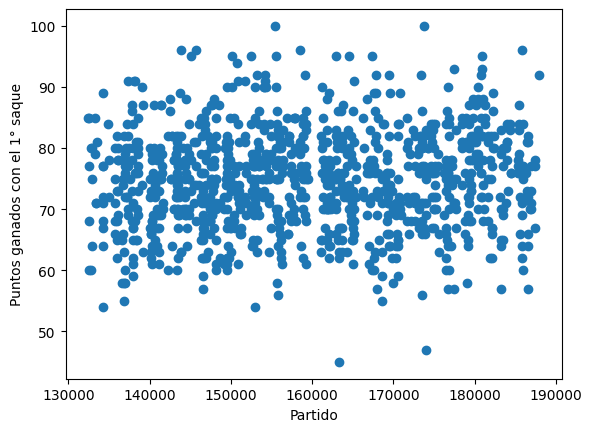

'Cantidad de puntos convertidos con el primer saque. Comparación con el perdedor para determinar estilos de juego'

In [29]:
y = df_nadal_1['w_1servewon_per']
x = df_nadal_1.index
plt.scatter(x, y)
plt.xlabel('Partido')
plt.ylabel('Puntos ganados con el 1° saque')
plt.show()

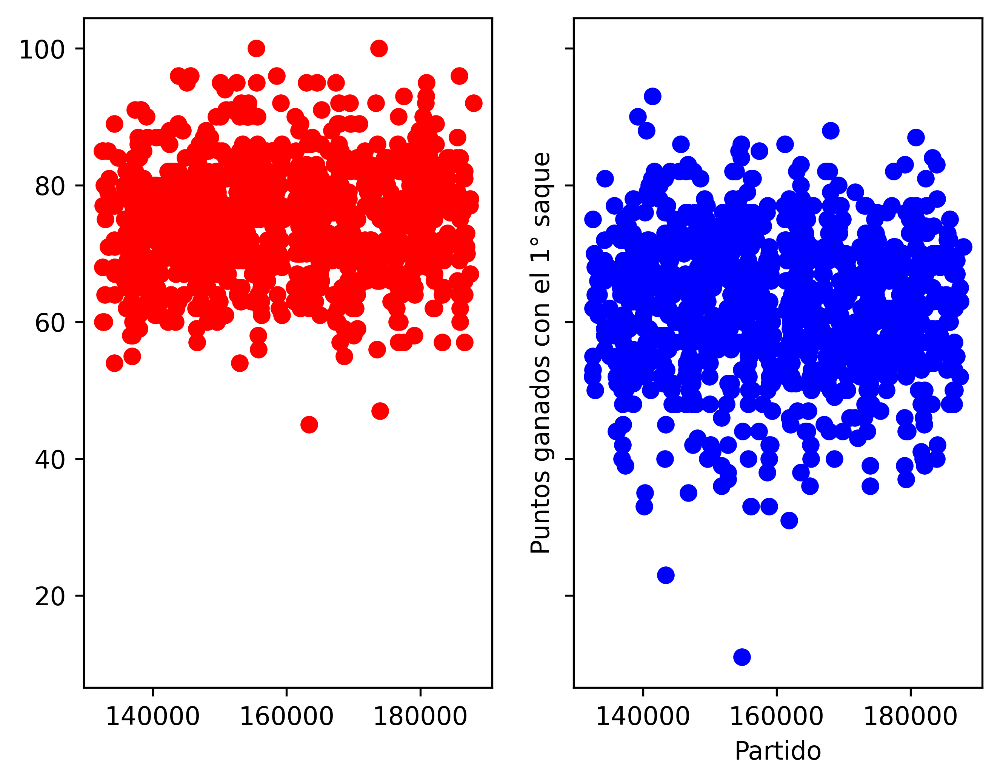

'Cantidad de puntos convertidos con el primer saque. Comparación con el perdedor para determinar estilos de juego'

In [30]:
fig, ax = plt.subplots(1,2,sharex=True, sharey=True, dpi=480)

y1 = df_nadal_1['w_1servewon_per']
x1 = df_nadal_1.index

y2 = df_nadal_1['l_1servewon_per']
x2 = df_nadal_1.index

ax[0].scatter(x1, y1, color='red')
ax[1].scatter(x2, y2, color='blue')

#plt.scatter(x, y)
plt.xlabel('Partido')
plt.ylabel('Puntos ganados con el 1° saque')
plt.show()
"Cantidad de puntos convertidos con el primer saque."

#### Determinamos en las superficies donde mayor cantidad de victorias ha conseguido.

surface
Hard      508
Clay      445
Grass      74
Carpet      1
Name: count, dtype: int64


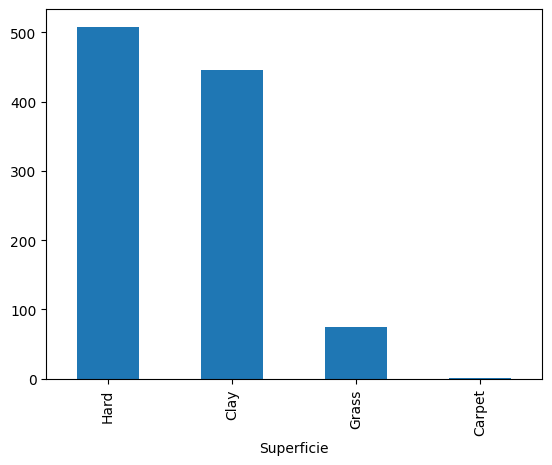

In [38]:
counts = df_nadal_1['surface'].value_counts()
print(counts)
counts.plot.bar()
plt.xlabel('Superficie')
plt.show()

#### Otra variable a tener en cuenta es la cantidad de aces. En algunos jugadores, es algo determinante ya que pueden definir su estilo de juego.

Text(0, 0.5, 'Frecuencia')

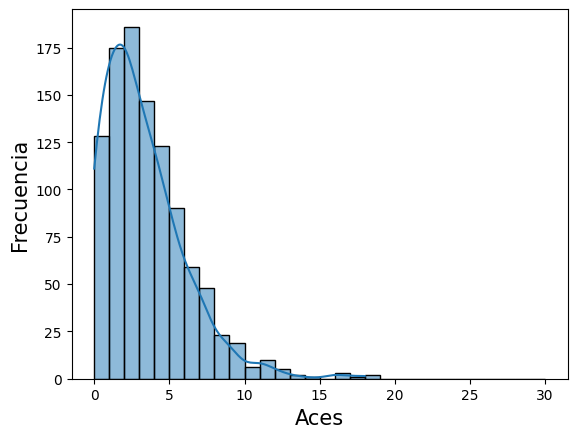

In [33]:
chart = sns.histplot(data=df_nadal_1, x="w_ace", bins=30, kde=True, binrange=[0,30])
chart.set_xlabel('Aces', fontdict={'size': 15})
chart.set_ylabel('Frecuencia', fontdict={'size': 15})

Text(0, 0.5, 'Frecuencia')

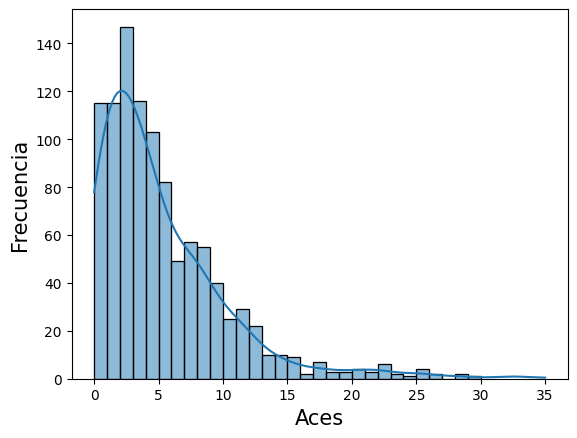

In [34]:
chart = sns.histplot(data=df_nadal_1, x="l_ace", bins=30, kde=True, binrange=[0,30])
chart.set_xlabel('Aces', fontdict={'size': 15})
chart.set_ylabel('Frecuencia', fontdict={'size': 15})

In [40]:
df_nadal_1['break_points_made'] = (df_nadal_1['l_bpFaced']-df_nadal_1['l_bpSaved']).astype(int)
df_nadal_1['break_points_recieved'] = (df_nadal_1['w_bpFaced']-df_nadal_1['w_bpSaved']).astype(int)

In [41]:
df_nadal_1

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,w_1serve_per,w_1servewon_per,l_1servewon_per,break_points_made,break_points_recieved
132447,2004-1536,Madrid Masters,Hard,48,M,20041018,15,104745,0,0,Rafael Nadal,L,185,ESP,18,102106,0,0,Davide Sanguinetti,R,188,ITA,32,6-2 6-1,3,R64,62,2,4,47,27,23,9,8,5,6,1,2,41,21,11,6,7,3,8,50,755,75,521,57,85,52,5,1
132522,2004-301,Auckland,Hard,32,A,20040112,12,104745,0,0,Rafael Nadal,L,185,ESP,17,102854,4,0,Sjeng Schalken,R,193,NED,27,7-6(2) 6-4,3,R32,125,1,0,88,65,39,14,11,6,9,1,0,92,71,38,11,11,9,13,48,766,16,1445,73,60,53,4,3
132532,2004-301,Auckland,Hard,32,A,20040112,22,104745,0,0,Rafael Nadal,L,185,ESP,17,104339,0,Q,Mario Ancic,R,196,CRO,19,7-6(0) 7-6(6),3,R16,113,2,2,79,54,37,18,12,5,7,8,4,83,51,32,18,12,2,4,48,766,74,475,68,68,62,2,2
132537,2004-301,Auckland,Hard,32,A,20040112,27,104745,0,0,Rafael Nadal,L,185,ESP,17,102571,0,0,Gregory Carraz,R,190,FRA,28,2-1 RET,3,QF,15,0,0,9,7,6,2,2,0,0,1,0,5,4,3,1,1,0,0,48,766,65,534,77,85,75,0,0
132540,2004-301,Auckland,Hard,32,A,20040112,30,104745,0,0,Rafael Nadal,L,185,ESP,17,102562,2,0,Jiri Novak,R,190,CZE,28,6-1 6-3,3,SF,64,1,0,47,31,24,11,8,1,1,2,3,65,36,20,14,8,6,10,48,766,14,1510,65,77,55,4,0
132734,2004-316,Bastad,Clay,32,A,20040705,14,104745,0,0,Rafael Nadal,L,185,ESP,18,103181,0,LL,Jiri Vanek,R,185,CZE,26,4-6 6-4 6-3,3,R32,118,0,2,86,69,42,10,15,6,11,0,4,88,50,31,15,14,3,9,60,685,147,275,80,60,62,6,5
132743,2004-316,Bastad,Clay,32,A,20040705,23,104745,0,0,Rafael Nadal,L,185,ESP,18,103490,0,Q,Santiago Ventura,R,183,ESP,24,6-1 6-2,3,R16,59,0,2,40,31,25,7,8,0,0,5,4,58,27,19,9,7,6,10,60,685,142,281,77,80,70,4,0
132856,2004-321,Stuttgart,Clay,48,A,20040712,27,104745,14,0,Rafael Nadal,L,185,ESP,18,103506,0,0,Martin Vassallo Arguello,R,183,ARG,24,7-6(4) 6-4,3,R32,128,1,3,85,50,32,15,11,7,12,4,9,85,51,33,10,11,8,14,57,685,132,314,58,64,64,6,5
132867,2004-321,Stuttgart,Clay,48,A,20040712,38,104745,14,0,Rafael Nadal,L,185,ESP,18,103428,3,0,Juan Ignacio Chela,R,190,ARG,24,6-2 6-3,3,R16,76,3,1,52,25,20,19,9,0,0,2,4,50,29,20,8,8,1,4,57,685,16,1320,48,80,68,3,0
132884,2004-325,Palermo,Clay,32,A,20040927,8,104745,6,0,Rafael Nadal,L,185,ESP,18,104597,0,Q,Nicolas Almagro,R,183,ESP,19,6-1 7-5,3,R32,69,0,1,52,33,25,9,10,0,2,1,1,45,22,11,11,9,2,7,49,745,99,418,63,75,50,5,2


#### Break points son aquellos puntos decisivos que se ganan contra el saque del rival. Esto es un indicador de un jugador que juega muy bien cuando recibe el saque de rival y es capaz de ganarle games sin su saque. 

Text(0, 0.5, 'Frecuencia')

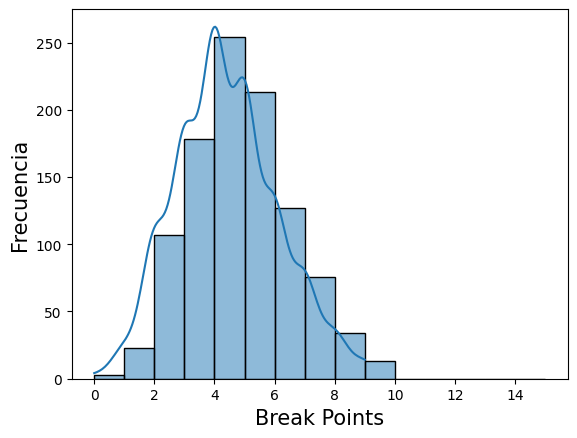

In [42]:
chart = sns.histplot(data=df_nadal_1, x="break_points_made", bins=15, kde=True, binrange=[0,15])
chart.set_xlabel('Break Points', fontdict={'size': 15})
chart.set_ylabel('Frecuencia', fontdict={'size': 15})

Text(0, 0.5, 'Frecuencia')

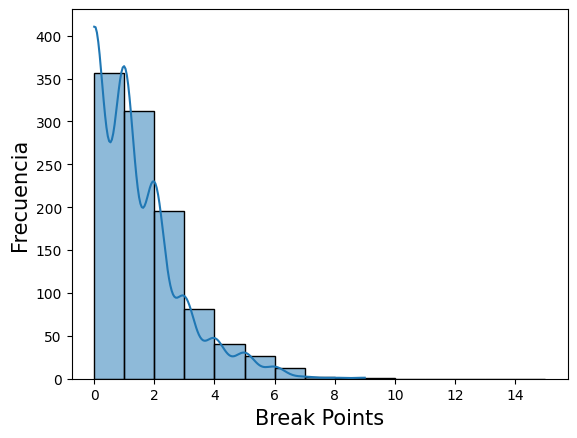

In [43]:
chart = sns.histplot(data=df_nadal_1, x="break_points_recieved", bins=15, kde=True, binrange=[0,15])
chart.set_xlabel('Break Points', fontdict={'size': 15})
chart.set_ylabel('Frecuencia', fontdict={'size': 15})

### Conclusiones:

#### - El describe nos da las medidas de los valores de w_ y l_.
#### - El porcentaje de los primeros saques es mas alto que los rivales. Eso es un indicador fuerte de que es un triunfo.
#### - Los aces depende mucho del jugador y de su estilo. En algunos casos, es irrelevante.
#### - Los break points son cruciales ya que dan vuelta el resultado. Es importante anotar tantos como es posible.